# Enunciado

Faça uma análise de cada dataset antes de mais nada, verificando:
- Características gerais
- Se tem campos nulos

Uma vez feito isso, faça para cada dataset:
- Determinar o número de clusters usando o método do elbow: escrever um texto com o valor em função do que foi exibido no gráfico.
- Treinar o modelo com kmeans:
kmeans = KMeans(n_clusters = ???, init = 'k-means++', n_init = 10, max_iter=300)
testar com init com o parâmetro random e com k-means++, e cada um com 300 iterações e 1000 iterações.
- Lembrar de gerar o cluster de cada instância:
X['cluster'] = pd.DataFrame(y_kmeans)

- Para cada teste, fazer um plot usando a feature x1 para eixo x, e a feature x2 para o eixo y conforme abaixo. Plotar também os cntróides.

#%matplolib notebook
#c color em funao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(X['x1'], X['x2'], s = 10, c = X['cluster'])
plt.scatter(centroids3[:, 0], centroids3[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

E finalmente, você com um ótimo cientista de dados, deve pesquisar como validar a eficácia do kmeans ao determinar o cluster de cada instância. Para tal, procure no google exemplos dos seguintes métodos e depois aplique para cada teste feito.

- silhouette_score
- calinski_harabasz_score
- davies_bouldin_score

Com os coeficientes de cada teste avalie (escrever uma justificativa) a eficácia da classificação feita pelo kmeans.

Ordem dos testes: determinar o número de clusters, executar o kmeans, determinar o cluster de cada instância, plotar, verificar a acurácia.
Para dataset 1:
1) random com 300 iterações:
2) random com 1000 iterações
3) kmeans++ com 300 iterações
4) kmeans++ com 1000 iterações

Para dataset 2:
1) random com 300 iterações:
2) random com 1000 iterações
3) kmeans++ com 300 iterações
4) kmeans++ com 1000 iterações

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


In [2]:
#Impotando dataset 1
df1 = pd.read_csv('Dataset/dataset_1.csv', sep=';')
#Examinando Data Type
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18500 entries, 0 to 18499
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      18500 non-null  float64
 1   x2      18500 non-null  float64
 2   x3      18500 non-null  float64
 3   x4      18500 non-null  float64
 4   x5      18500 non-null  float64
 5   x6      18500 non-null  float64
 6   x7      18500 non-null  float64
 7   x8      18500 non-null  float64
 8   x9      18500 non-null  float64
 9   x10     18500 non-null  float64
 10  x11     18500 non-null  float64
 11  x12     18500 non-null  float64
dtypes: float64(12)
memory usage: 1.7 MB


In [3]:
#Verificando os primeiros 5 registros
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675


In [4]:
#Verificando valores nulos
df1.isna().sum()

X1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
dtype: int64

In [5]:
#Examinando características gerais do dados
df1.describe()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
count,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000
mean,0.479316,0.401101,-0.036613,0.115756,-0.067300,-0.050764,-0.356024,1.258355,-1.014831,-0.419818,-0.292423,-1.619202
std,6.162037,5.936852,5.929547,5.288724,6.450516,5.489512,5.701534,5.882630,6.187764,6.374784,5.910394,5.935993
min,-12.562877,-12.845130,-13.184632,-12.684910,-13.220067,-12.976295,-13.168605,-11.877164,-12.944935,-12.986817,-12.595942,-12.920032
25%,-4.163954,-4.969523,-5.410800,-3.845578,-5.982486,-4.613177,-5.641036,-4.064888,-6.869708,-6.034305,-4.583072,-6.524806
50%,0.246958,2.038327,0.719043,0.942982,0.129550,0.092994,-0.203821,1.712891,-1.486036,-0.639076,-1.030882,-2.586011
75%,6.534062,5.094108,4.827765,4.285728,5.821847,4.081665,3.813254,6.672852,4.271135,5.006888,4.065448,2.599988
max,11.706389,12.152035,12.156041,11.984369,12.624881,12.034950,12.643021,12.347370,12.334277,13.073007,12.721117,12.397334


# Definindo o número de Cluster utilizando o método Elbow
## Dataset 1
###  1) random

/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


1 7849104.252696779
2 6857378.203173598
3 6201162.474280817
4 5699478.27599166
5 5215109.295806451


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


6 4770991.237520134
7 4550799.218605954
8 4076679.867982791


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


9 3867285.9917310714
10 3580758.480012079
11 3427109.2098739673
12 3017146.227395994


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/si

13 2809194.6358882217
14 2713291.941207185
15 2521298.4496802823


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


16 2359115.6454908014
17 2432574.019758012
18 2136690.504436676
19 1961944.082644477


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/si

20 1850795.2569478538
21 1658044.0744504838
22 1691338.8019037428


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


23 1483954.561581299
24 1522928.765415435
25 1324167.0979752664
26 1203064.5418305052


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


27 1313845.8885261377
28 943164.6300495706


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


29 936357.5377531882
30 905716.8859238144


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


31 902393.828451178
32 730237.6402926801


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


33 818387.7801897996
34 687406.794307139


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


35 785871.2643921085


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


36 717912.364765653


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


37 526170.7270947313


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


38 518132.9317373839


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


39 511837.66902377526


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


40 622917.5112383431


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


41 507511.0963476134


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


42 268117.07506589335


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


43 437412.5936526812


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


44 452387.47926797037


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


45 317557.2979528308


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


46 266542.3559817582


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


47 291685.0531090026


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


48 217264.2647697147


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


49 272959.62266832625


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


50 216645.89930888126


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


51 216317.0992771639


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


52 216023.2550557151


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


53 273993.60163779976


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


54 215343.89685788107


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


55 339109.5231203113


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


56 213894.62303833064


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


57 214251.54668144023


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


58 264191.855000904


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


59 213259.1509650102


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


60 213089.5593323348


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


61 213664.47345361442


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


62 212705.87120284716


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


63 211967.03414249897


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


64 212630.34035308548


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


65 212102.57552487066


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


66 210831.88067661732


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


67 210788.64079210753


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


68 259279.06479949888


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


69 210177.55283981483


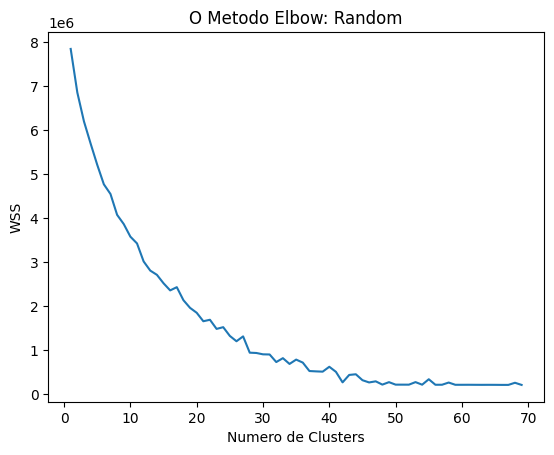

In [7]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss_random = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 70):
    kmeans1_1 = KMeans(n_clusters = i, init = 'random')
    kmeans1_1.fit(df1)
    print (i,kmeans1_1.inertia_)
    wcss_random.append(kmeans1_1.inertia_)

plt.plot(range(1, 70),wcss_random)
plt.title('O Metodo Elbow: Random')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

In [10]:
display(wcss_random[40:]) #Exibindo a partir do registro de numero 40

[507511.0963476134,
 268117.07506589335,
 437412.5936526812,
 452387.47926797037,
 317557.2979528308,
 266542.3559817582,
 291685.0531090026,
 217264.2647697147,
 272959.62266832625,
 216645.89930888126,
 216317.0992771639,
 216023.2550557151,
 273993.60163779976,
 215343.89685788107,
 339109.5231203113,
 213894.62303833064,
 214251.54668144023,
 264191.855000904,
 213259.1509650102,
 213089.5593323348,
 213664.47345361442,
 212705.87120284716,
 211967.03414249897,
 212630.34035308548,
 212102.57552487066,
 210831.88067661732,
 210788.64079210753,
 259279.06479949888,
 210177.55283981483]

###  O método "random" inicializa os centróides de maneira aleatória, o que significa que as posições iniciais dos centróides podem ser muito distantes umas das outras ou muito próximas. Isso pode levar a uma convergência mais lenta e a agrupamentos menos eficientes, resultando em uma curva do cotovelo menos nítida. Fazendo uma analise mais atenta nos valores wcss, observa-se que para esse modelo **40 clusters** parecem funcionar bem para esse metodo.



### 2) Kmeans++

/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


1 7849104.252696779


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2 6857377.694633107


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


3 6171695.050223834


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


4 5610291.894908246


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


5 5164297.321505262


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


6 4774015.113269552


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


7 4472430.166056442


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


8 4101494.225856305


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


9 3766653.786946172


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


10 3550970.2397822775


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


11 3311012.197657215


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


12 3037728.584243291


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


13 2895646.6593524995


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


14 2661124.2660439103


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


15 2414348.231381697


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


16 2279202.880107131


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


17 2066800.3279990654


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


18 1919514.1075252825


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


19 1823303.3693831337


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


20 1667628.9867461137


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


21 1595626.9607564413


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


22 1490658.0507881164


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


23 1328199.178420086


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


24 1216664.908105125


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


25 1142393.9914789647


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


26 993452.893943879


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


27 912758.4178881634


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


28 817214.288060683


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


29 709693.2831868564


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


30 626152.2201014651


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


31 561123.7970362052


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


32 486538.03520797635


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


33 427969.2101803707


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


34 371440.4226807378


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


35 320720.15443306515


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


36 270402.17021677014


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


37 221435.21622272927


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


38 220992.50479883957


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


39 220573.097973795


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


40 220191.81470478515


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


41 219775.16604489757


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


42 219344.84994845247


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


43 218894.55642669855


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


44 218496.21970414254


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


45 218129.76387363038


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


46 217709.09244183474


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


47 217297.26967813136


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


48 216873.98643926636


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


49 216545.2191932993


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


50 216089.47395920623


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


51 215571.28774660628


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


52 215356.66563555872


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


53 214930.13740521364


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


54 214385.87824061612


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


55 214107.5394737038


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


56 213787.9593619881


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


57 213434.3900015981


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


58 212843.05750998558


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


59 212582.85477186958


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


60 212136.0841046365


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


61 211889.68813630493


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


62 211634.27012600884


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


63 211240.90940662008


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


64 210618.9615126367


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


65 210542.9807819911


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


66 210004.0408623025


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


67 209628.75363602504


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


68 209140.194307356


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


69 208729.7971690564


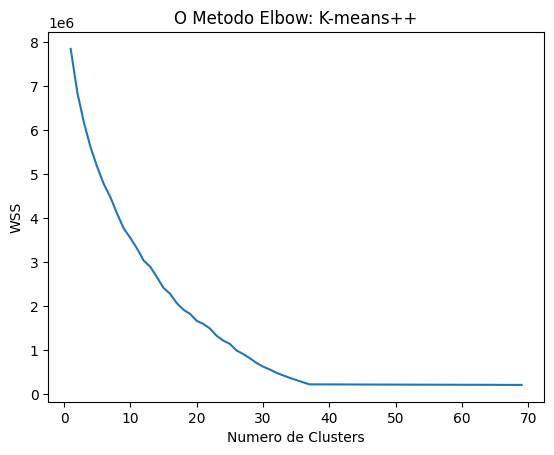

In [11]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss_kmeans = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 70):
    kmeans1_2 = KMeans(n_clusters = i, init = 'k-means++')
    kmeans1_2.fit(df1)
    print (i,kmeans1_2.inertia_)
    wcss_kmeans.append(kmeans1_2.inertia_)

plt.plot(range(1, 70), wcss_kmeans)
plt.title('O Metodo Elbow: K-means++')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

In [23]:
display(wcss_kmeans[25:40]) #Exibindo registros do 25 ao 35. 

[993452.893943879,
 912758.4178881634,
 817214.288060683,
 709693.2831868564,
 626152.2201014651,
 561123.7970362052,
 486538.03520797635,
 427969.2101803707,
 371440.4226807378,
 320720.15443306515,
 270402.17021677014,
 221435.21622272927,
 220992.50479883957,
 220573.097973795,
 220191.81470478515]

### Observa-se uma diferenca expressiva entre o registro 35 e o registro de numero 36, seguida de constancia e pouca variancia entre os resultados observados. Sendo assim, para o metodo k-means++ nota-se que a utilizacao de **35 Clusters** mostra-se a melhor solucao.


# Instânciando o Algoritmo K-means 
## Dataset 1
### 1) random com 300 iterações

In [15]:
kmeans_r1 = KMeans(n_clusters = 40, init = 'random', n_init = 10, max_iter=300)
kmeans_r1.fit(df1)

KMeans(init='random', n_clusters=40, n_init=10)

In [16]:
kmeans_r1.cluster_centers_

array([[ 7.98770771e+00,  5.22403161e+00,  3.68406708e+00,
         4.23727226e+00, -3.14477362e+00, -4.02231796e+00,
         6.11574583e+00,  6.41432107e+00,  7.41769666e+00,
         8.08858669e+00, -2.05400085e-02,  5.75249469e-01],
       [ 3.46615748e+00,  5.29639603e+00, -5.27809548e+00,
         4.62195571e+00, -2.59949930e+00,  2.69194150e+00,
         2.63440124e+00,  7.06450906e-01, -8.18422714e+00,
         6.69173917e+00, -3.69182056e+00, -6.24804082e+00],
       [-2.46435010e+00,  8.99803260e+00,  4.63747033e+00,
         1.97203671e+00, -6.87053704e+00, -6.84646491e+00,
        -8.87044098e+00,  7.34963677e+00,  2.06439216e+00,
         4.08262148e+00, -9.65421302e+00,  9.42339493e+00],
       [ 5.85930424e+00,  5.80142646e+00, -8.18664221e+00,
        -9.23108437e-03, -8.91125663e+00,  1.00401530e+00,
        -1.25962333e+00,  7.80949584e+00, -2.95876560e+00,
        -7.70787652e+00, -7.14458578e+00,  5.25337047e+00],
       [-4.27086274e+00,  1.73802212e+00, -9.4057756

In [17]:
labels = kmeans_r1.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_r1'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,6
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,30
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,5
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,22
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,12


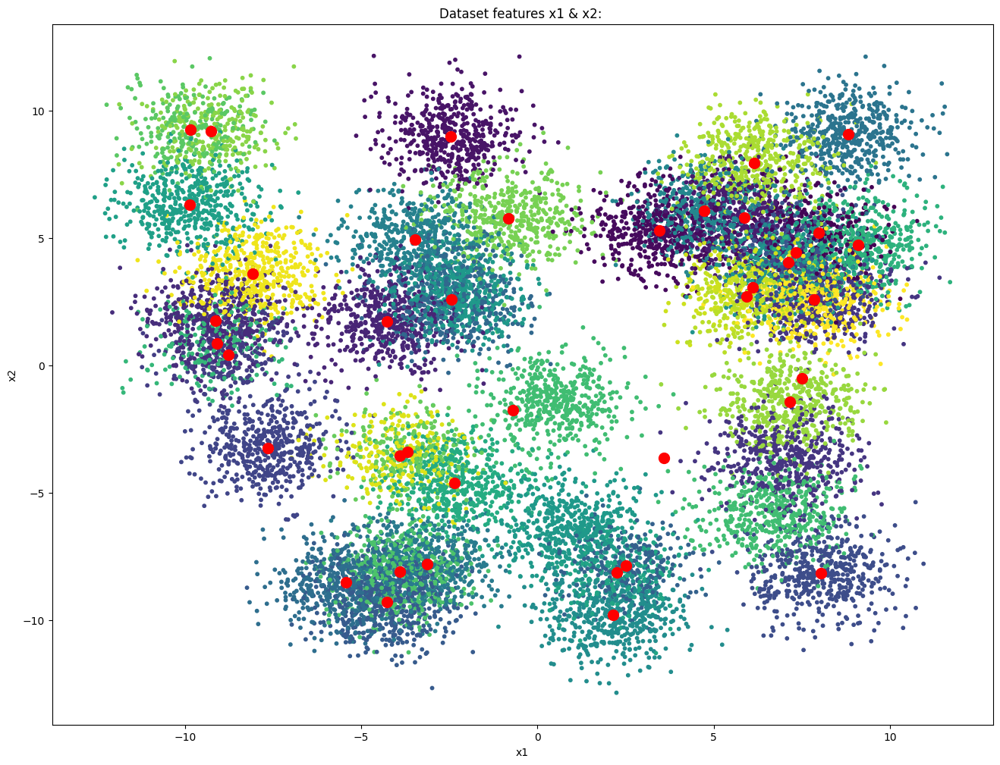

In [18]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_r1'])
plt.scatter(kmeans_r1.cluster_centers_[:, 0], kmeans_r1.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: RANDOM')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 


In [43]:
labels = kmeans_r1.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

In [44]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.6529
Calinski-Harabasz Score: 5934.5099
Davies-Bouldin Score: 0.9097


### 1) random com 1000 iterações

In [24]:
kmeans_r2 = KMeans(n_clusters = 40, init = 'random', n_init = 10, max_iter=1000)
kmeans_r2.fit(df1)

KMeans(init='random', max_iter=1000, n_clusters=40, n_init=10)

In [25]:
kmeans_r2.cluster_centers_

array([[ 7.16110635e+00, -1.43383634e+00,  4.99330912e+00,
         5.03164443e+00, -7.92246910e+00,  8.01016171e+00,
         1.48226204e-01,  6.53284944e+00, -3.62537648e+00,
         7.91899554e+00, -2.21070295e+00, -9.78305542e+00,
         3.30000000e+01],
       [-9.14377241e+00,  1.77183477e+00,  3.60422702e+00,
        -9.66178207e+00,  1.87759940e-01, -5.43727004e+00,
         2.88258048e+00, -6.45994113e+00,  3.84408547e+00,
        -2.29105094e+00,  8.76828360e+00, -7.20987175e+00,
         5.00000000e+00],
       [-3.09941337e+00, -7.66384885e+00,  8.08545810e+00,
         7.53241016e+00, -4.46695096e+00,  3.33965591e+00,
         6.50058388e+00,  1.26095934e+00,  1.14880679e+00,
        -5.43583276e+00, -8.20625957e+00,  8.29767517e+00,
         1.60000000e+01],
       [-9.52470683e+00,  9.22324885e+00,  6.75045562e+00,
         3.85493173e+00, -1.87359402e+00, -6.53579137e+00,
        -6.92747588e+00, -5.01491874e+00,  9.33464961e-01,
         4.31621838e+00,  3.19991121e

In [26]:
labels = kmeans_r2.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_r2'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,6,34
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,30,20
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,5,1
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,22,29
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,12,38


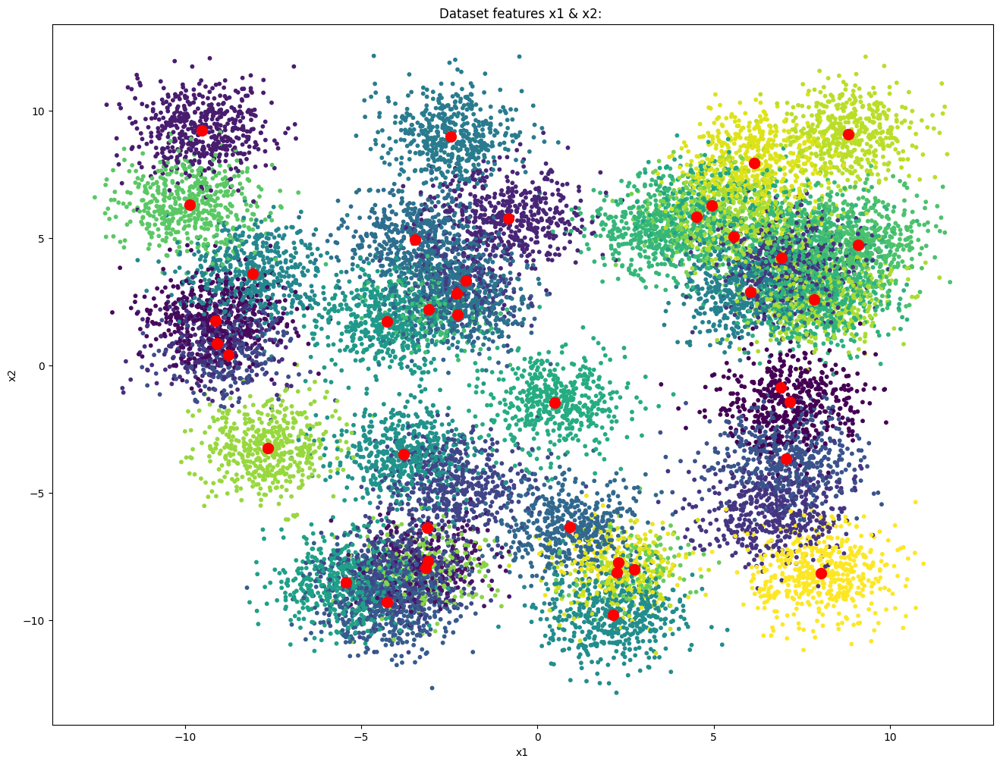

In [27]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_r2'])
plt.scatter(kmeans_r2.cluster_centers_[:, 0], kmeans_r2.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: RANDOM ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [28]:
labels = kmeans_r2.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

### Com base nessas métricas, o ***método com 1000 iterações*** parece ser a escolha preferível, pois apresenta melhores resultados em todas as métricas. Ele alcança maior pontuação no Silhouette Score, Calinski-Harabasz Score e menor pontuação no Davies-Bouldin Score, sugerindo que os clusters estão mais bem definidos e separados nessa configuração. 

In [29]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.6986
Calinski-Harabasz Score: 8836.9351
Davies-Bouldin Score: 0.6198


### 3) k-means++ com 300 iterações

In [30]:
kmeans_k1 = KMeans(n_clusters = 35, init = 'k-means++', n_init = 10, max_iter=300)
kmeans_k1.fit(df1)

KMeans(n_clusters=35, n_init=10)

In [32]:
kmeans_k1.cluster_centers_

array([[-8.08563561e+00,  3.60088275e+00, -8.57963989e+00,
        -3.59530863e+00,  6.90587234e+00, -9.65532760e+00,
         6.21710647e+00, -4.36449908e+00, -7.65265468e+00,
         3.89572034e+00,  2.59803366e+00,  7.58239493e+00,
         3.80000000e+01,  1.80000000e+01],
       [ 3.46615748e+00,  5.29639603e+00, -5.27809548e+00,
         4.62195571e+00, -2.59949930e+00,  2.69194150e+00,
         2.63440124e+00,  7.06450906e-01, -8.18422714e+00,
         6.69173917e+00, -3.69182056e+00, -6.24804082e+00,
         1.00000000e+00,  2.60000000e+01],
       [-2.95876520e+00,  3.76561523e+00,  1.58517689e+00,
         6.97031080e+00,  3.20890477e+00, -2.72733812e+00,
        -8.29484686e+00,  1.43671132e-01, -7.03698649e+00,
        -1.69813400e+00,  9.16374216e+00, -3.60651240e-01,
         1.50000000e+01,  1.44700000e+01],
       [ 9.09892416e+00,  4.74853900e+00,  1.07520702e+00,
         2.28971481e+00, -1.58363399e+00, -5.00033164e+00,
        -2.78947999e+00,  5.15042553e+00, -9.

In [33]:
labels = kmeans_k1.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_k1'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2,Cluster_k1
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,6,34,7
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,30,20,24
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,5,1,10
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,22,29,11
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,12,38,19


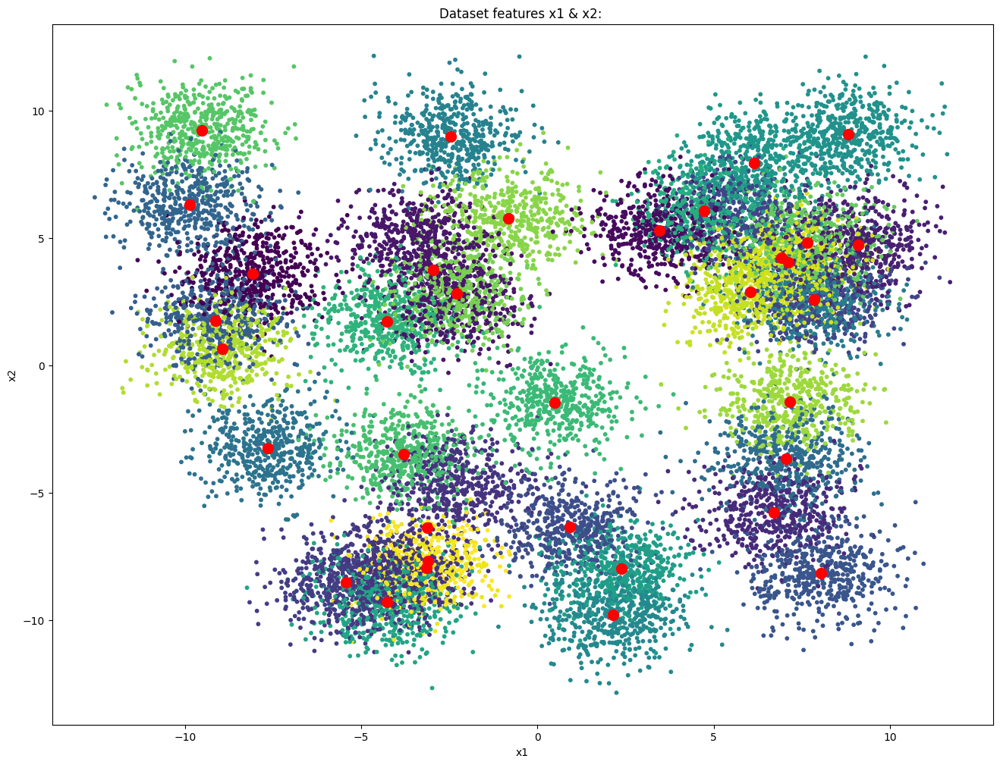

In [34]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_k1'])
plt.scatter(kmeans_k1.cluster_centers_[:, 0], kmeans_k1.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: KEMEANS++')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [35]:
labels = kmeans_k1.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

In [36]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.7583
Calinski-Harabasz Score: 13173.0356
Davies-Bouldin Score: 0.4682


### 4) k-means++ com 1000 iterações

In [37]:
kmeans_k2 = KMeans(n_clusters = 35, init = 'k-means++', n_init = 10, max_iter=1000)
kmeans_k2.fit(df1)

KMeans(max_iter=1000, n_clusters=35, n_init=10)

In [38]:
kmeans_k2.cluster_centers_ 

array([[ 6.14179858e+00,  7.96146994e+00, -3.65953948e+00,
        -7.77792173e+00, -5.42717077e+00, -1.41516374e+00,
         6.44761429e+00,  7.26510677e+00, -9.91462217e+00,
         2.90249100e-01, -1.63383182e+00, -5.59772769e+00,
         3.40000000e+01,  3.70000000e+01,  1.80000000e+01],
       [-4.27738737e+00, -9.27002307e+00,  2.16821762e+00,
         5.26562038e-02, -8.94050156e+00, -4.49137470e+00,
         8.16297709e+00, -5.21086959e+00, -7.03520304e+00,
        -2.13067288e-01,  9.67343143e+00, -5.13812540e+00,
         1.10000000e+01,  1.10000000e+01,  2.00000000e+01],
       [-3.12174088e+00, -6.35248396e+00,  5.16575590e+00,
        -2.05689666e+00, -5.97480225e+00,  3.58451088e-01,
        -8.30687999e+00,  7.10881955e+00, -6.64998997e+00,
         6.47019987e+00,  8.83686752e-01, -2.82703014e+00,
         2.60000000e+01,  8.00000000e+00,  5.00000000e+00],
       [ 3.46615748e+00,  5.29639603e+00, -5.27809548e+00,
         4.62195571e+00, -2.59949930e+00,  2.69194150

In [39]:
labels = kmeans_k2.labels_

#Armazenando variável cluster no dataframe
df1['Cluster_k2'] = labels
df1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2,Cluster_k1,Cluster_k2
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297,6,34,7,8
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805,30,20,24,6
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419,5,1,10,20
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983,22,29,11,5
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675,12,38,19,16


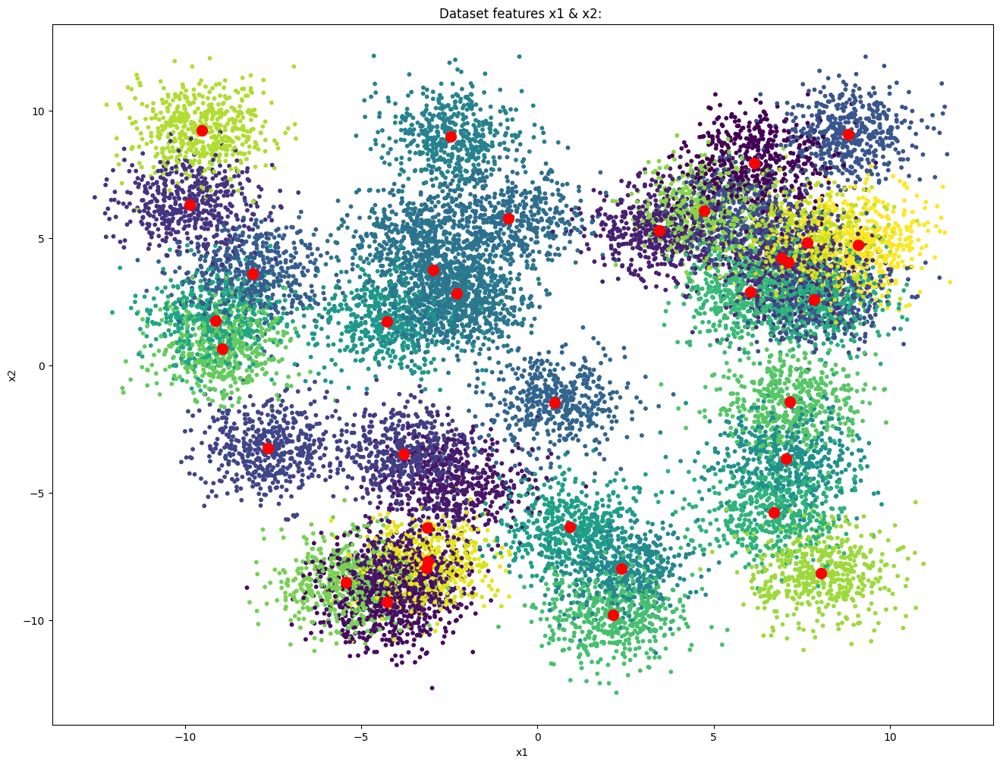

In [40]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df1['X1'], df1['x2'], s = 10, c = df1['Cluster_k2'])
plt.scatter(kmeans_k2.cluster_centers_[:, 0], kmeans_k2.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: KMEANS++')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

validacao da eficácia



In [41]:
labels = kmeans_k2.labels_
silhouette = silhouette_score(df1, labels)
calinski = calinski_harabasz_score(df1, labels)
davies_bouldin = davies_bouldin_score(df1, labels)

In [42]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.7809
Calinski-Harabasz Score: 14889.7023
Davies-Bouldin Score: 0.4359


### Com base nessas métricas, o método K-Means++ com ***1000 iterações*** mostra-se como a escolha mais forte. Ele tem pontuações mais altas em todas as métricas, o que indica que produz clusters mais definidos e separados

## **Clonclusoes para Dataset 1**

### comparando as métricas das duas configurações: 
***"Random" e "K-Means++", ambas com 1000 iterações:***    
Método Random (1000 Iterações):

Silhouette Score: 0.6986
Calinski-Harabasz Score: 8836.9351
Davies-Bouldin Score: 0.6198
Método K-Means++ (1000 Iterações):

Silhouette Score: 0.7809
Calinski-Harabasz Score: 14889.7023
Davies-Bouldin Score: 0.4359
Aqui está uma comparação das métricas entre os dois métodos:

Silhouette Score: O método K-Means++ (1000 iterações) tem um Silhouette Score significativamente maior (0.7809) em comparação com o método Random (1000 iterações), que tem um Silhouette Score de 0.6986. Isso indica que o método K-Means++ produz clusters com melhor separação e semelhança interna.

Calinski-Harabasz Score: Novamente, o método K-Means++ supera o método Random em termos de Calinski-Harabasz Score. O método K-Means++ (1000 iterações) tem um valor muito maior (14889.7023) em comparação com o método Random (1000 iterações) com um valor de 8836.9351. Isso sugere que o método K-Means++ produz agrupamentos mais bem definidos.

Davies-Bouldin Score: O método K-Means++ (1000 iterações) também supera o método Random em relação ao Davies-Bouldin Score. O método K-Means++ tem uma pontuação mais baixa (0.4359) em comparação com o método Random (0.6198). Um valor mais baixo no Davies-Bouldin Score indica uma melhor divisão dos clusters.

Com base n***essas métricas, o método K-Means++ ***com 1000 iterações parece ser a escolha preferível. Ele produz clusters que são mais bem definidos e separados em comparação com o método Random com 1000 iterações.

## Dataset 2

In [48]:
#Impotando dataset 1
df2 = pd.read_csv('Dataset/dataset_2.csv', sep=';')
#Examinando Data Type
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108500 entries, 0 to 108499
Data columns (total 12 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   x1      108500 non-null  float64
 1   x2      108500 non-null  float64
 2   x3      108500 non-null  float64
 3   x4      108500 non-null  float64
 4   x5      108500 non-null  float64
 5   x6      108500 non-null  float64
 6   x7      108500 non-null  float64
 7   x8      108500 non-null  float64
 8   x9      108500 non-null  float64
 9   x10     108500 non-null  float64
 10  x11     108500 non-null  float64
 11  x12     108500 non-null  float64
dtypes: float64(12)
memory usage: 9.9 MB


In [49]:
#Verificando os primeiros 5 registros
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676


In [50]:
#Verificando dados nulos
df2.isna().sum()

x1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
dtype: int64

In [51]:
#Examinando características gerais do dados
df1.describe()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r1,Cluster_r2,Cluster_k1,Cluster_k2
count,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000,18500.000000
mean,0.479316,0.401101,-0.036613,0.115756,-0.067300,-0.050764,-0.356024,1.258355,-1.014831,-0.419818,-0.292423,-1.619202,18.813243,18.990162,15.554162,15.824432
std,6.162037,5.936852,5.929547,5.288724,6.450516,5.489512,5.701534,5.882630,6.187764,6.374784,5.910394,5.935993,11.152816,11.364471,9.985780,9.864879
min,-12.562877,-12.845130,-13.184632,-12.684910,-13.220067,-12.976295,-13.168605,-11.877164,-12.944935,-12.986817,-12.595942,-12.920032,0.000000,0.000000,0.000000,0.000000
25%,-4.163954,-4.969523,-5.410800,-3.845578,-5.982486,-4.613177,-5.641036,-4.064888,-6.869708,-6.034305,-4.583072,-6.524806,9.000000,8.000000,7.000000,8.000000
50%,0.246958,2.038327,0.719043,0.942982,0.129550,0.092994,-0.203821,1.712891,-1.486036,-0.639076,-1.030882,-2.586011,19.000000,19.000000,15.000000,15.000000
75%,6.534062,5.094108,4.827765,4.285728,5.821847,4.081665,3.813254,6.672852,4.271135,5.006888,4.065448,2.599988,27.000000,28.000000,24.000000,24.000000
max,11.706389,12.152035,12.156041,11.984369,12.624881,12.034950,12.643021,12.347370,12.334277,13.073007,12.721117,12.397334,39.000000,39.000000,34.000000,34.000000


# Definindo o número de Cluster utilizando o método Elbow
## Dataset 2
###  1) random

In [ ]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss_31 = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 300):
    kmeans3_1 = KMeans(n_clusters = i, init = 'random')
    kmeans3_1.fit(df2)
    print (i,kmeans3_1.inertia_)
    wcss_31.append(kmeans3_1.inertia_)

plt.plot(range(1, 300), wcss_31)
plt.title('O Metodo Elbow: random')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

In [ ]:
wcss_31

## 2)Kmeans++

In [ ]:
# Estimar o valor de K pode ser um problema.
# tentar encontrar um ponto no grafico onde a variancia dos dados em relacao
# ao numero de cluster, nao eh tao representatica: a queda nao eh tao brusca: este é o
# valor ideal do parametro K.
#%matplotlib notebook
%matplotlib inline

wcss_22 = [] # lista vazia que acumula os erros quadraticos

for i in range(1, 300):
    kmeans2_2 = KMeans(n_clusters = i, init = 'k-means++')
    kmeans2_2.fit(df2)
    print (i,kmeans2_2.inertia_)
    wcss_22.append(kmeans2_2.inertia_)

plt.plot(range(1, 200), wcss_22)
plt.title('O Metodo Elbow: K-means++')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


1 45193158.97379131


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2 41722616.60519419


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


3 39246938.18795433


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


4 37255584.94668189


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


5 35534743.3290551


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


6 33977827.812763765


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


7 32804632.96749142


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


8 31886189.52858723


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


9 30913069.34979565


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


10 30196441.825060688


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


11 29283345.793981474


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


12 28606464.566722438


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


13 27949402.90600268


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


14 27322425.60653073


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


15 26534326.33225193


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


16 26065919.29339994


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


17 25817698.181984812


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


18 25140194.685296044


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


19 24557730.393376768


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


20 24445850.124285545


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


21 23550429.042590395


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


22 23449353.277173646


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


23 22989352.80194696


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


24 22671281.66781858


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


25 22475993.201173153


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


26 22039753.689157832


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


27 21676667.073689807


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


28 21503433.071928173


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


29 21020481.01803229


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


30 20815808.665738184


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


31 20388803.265910234


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


32 20329785.67752304


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


33 19734151.015488923


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


34 19792908.7228674


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


35 19516480.31752924


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


36 19397771.12312615


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


37 19017128.86806026


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


38 18831618.60344545


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


39 18530433.474789765


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


40 18288674.079757437


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


41 18142054.539453287


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


42 17837701.175593384


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


43 17485848.049260397


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


44 17462043.798454754


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


45 17363847.98914528


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


46 17040868.52626945


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


47 16984557.03331536


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


48 16720738.391150089


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


49 16428854.396362975


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


50 16227622.101784375


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


51 16120469.931306258


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


52 15806630.538332978


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


53 15750514.101567078


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


54 15489503.29045685


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


55 15308357.308853617


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


56 15299476.411719263


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


57 15122222.349037103


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


58 14732779.275901195


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


59 14735606.551713685


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


60 14511370.92489648


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


61 14407198.982213741


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


62 14260086.496481625


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


63 14263510.585049732


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


64 13886603.249155898


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


65 13627752.491954591


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


66 13547020.23264832


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


67 13521238.62589356


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


68 13189970.322207853


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


69 13258412.85581362


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


70 13048411.889704347


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


71 12941994.255592162


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


72 12753585.75526053


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


73 12609847.910345335


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


74 12487593.1767142


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


75 12277175.221723678


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


76 12098962.590028888


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


77 11911687.85360106


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


78 11995153.551503893


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


79 11857701.686560888


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


80 11730446.413169583


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


81 11451934.120697672


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


82 11357175.586686274


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


83 11352177.292753985


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


84 11133139.260093356


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


85 10992546.160812035


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


86 10967677.69866317


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


87 10757281.350944143


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


88 10715797.482836712


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


89 10386637.158776343


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


90 10484186.189090211


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


91 10385496.10030524


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


92 10250747.614516668


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


93 9935861.928953936


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


94 9951539.71792389


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


95 9814761.70932924


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


96 9847889.55040203


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


97 9678114.04257091


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


98 9569505.762566688


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


99 9492759.154076595


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


100 9285108.875283308


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


101 9230892.847180607


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


102 9176346.447543047


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


103 8936131.727080941


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


104 8791485.720328202


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


105 8813765.058869924


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


106 8525998.931051586


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


107 8620326.193909176


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


108 8550611.877645921


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


109 8370255.719989115


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


110 8276840.163445775


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


111 8188937.099234436


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


112 8077737.544389822


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


113 7924621.273210969


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


114 7895782.344154879


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


115 7900346.440157958


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


116 7721695.737101512


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


117 7583437.844104056


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


118 7479018.386216555


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


119 7429879.678700648


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


120 7334733.321522616


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


121 7253481.306531791


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


122 7104813.541428113


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


123 7053562.408328192


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


124 7026672.9348846


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


125 6862087.508442741


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


126 6809625.954743284


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


127 6735588.305203456


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


128 6635776.306323586


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


129 6584635.5107857


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


130 6397177.907163028


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


131 6454737.168899865


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


132 6251257.313928527


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


133 6244466.198173729


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


134 6138003.906074645


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


135 6024039.334481077


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


136 5779170.068120406


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


137 5909165.747939175


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


138 5802871.56913363


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


139 5688688.281452168


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


140 5672270.7248715


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


141 5598943.641743579


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


142 5525497.108517988


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


143 5465443.809479347


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


144 5348109.652948468


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


145 5222707.827850396


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


146 5164158.30485582


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


147 5099682.144656332


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


148 5012891.952094886


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


149 4931331.154138815


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


150 4839959.131929


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


151 4840107.476583081


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


152 4740615.552333818


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


153 4683406.15402181


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


154 4602422.948379793


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


155 4577927.220562801


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


156 4524676.752995536


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


157 4396068.564457204


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


158 4364511.799840968


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


159 4232208.0964503195


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


160 4214093.844387011


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


161 4121150.097787208


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


162 4080201.0558698173


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


163 4019526.499687997


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


164 3942882.8483028873


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


165 3904868.9344392326


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


166 3842074.872334586


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


167 3738047.563159462


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


168 3694077.4733180166


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


169 3663948.4735248736


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


170 3600096.784247824


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


171 3512590.5128257414


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


172 3440204.8608032493


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


173 3411487.411078495


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


174 3373071.518431449


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


175 3247007.749676052


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


176 3193053.4262296115


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


177 3183057.2515907837


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


178 3102630.2139880443


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


179 3041359.883520017


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


180 3019606.780595356


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


181 2921107.7192147654


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


182 2877787.8783210744


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


183 2820131.4593436313


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


184 2776158.275051748


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


185 2720160.2598888893


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


186 2691242.105380563


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


187 2628714.5953290663


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


188 2579795.989389567


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


189 2505823.9900281415


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


190 2439539.431704285


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


191 2363945.466125132


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


192 2351662.514885387


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


193 2279615.9546673936


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


194 2243805.092511041


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


195 2179161.0552841756


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


196 2144369.9664876703


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


197 2097752.4854140677


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


198 2065943.1339262305


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


199 2009109.7859270799


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


200 1944150.670406229


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


201 1920907.9346305968


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


202 1864291.6328399437


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


203 1816846.4569623652


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


204 1789539.9576179849


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


205 1744031.693568608


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


206 1693812.4239246356


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


207 1644300.1338106855


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


208 1615622.0960060116


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


209 1594780.5961249832


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


210 1568268.317341609


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


211 1503346.200705681


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


212 1446390.9417778281


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


213 1442458.7441113777


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


214 1447380.3459134814


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


215 1437710.6590842628


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


216 1374896.105592816


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


217 1355890.9560064625


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


218 1361549.914228609


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


219 1317813.896165411


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


220 1317413.5213794333


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


221 1353729.1692281368


/home/erivelton/anaconda3/envs/AprendizadoMaquina/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [ ]:
wcss_22

# Instânciando o Algoritmo K-means 
## Dataset 2
### 1) random com 300 iterações

In [62]:
kmeans_r21 = KMeans(n_clusters = 25, init = 'random', n_init = 10, max_iter=300)
kmeans_r21.fit(df2)

KMeans(n_clusters=25, n_init=10)

In [64]:
labels = kmeans_r21.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_r21'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21,Cluster_k22
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,6,3,10,5
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,11,1,9,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,0,0,3
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,14,0,3,7
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,18,5,6,2


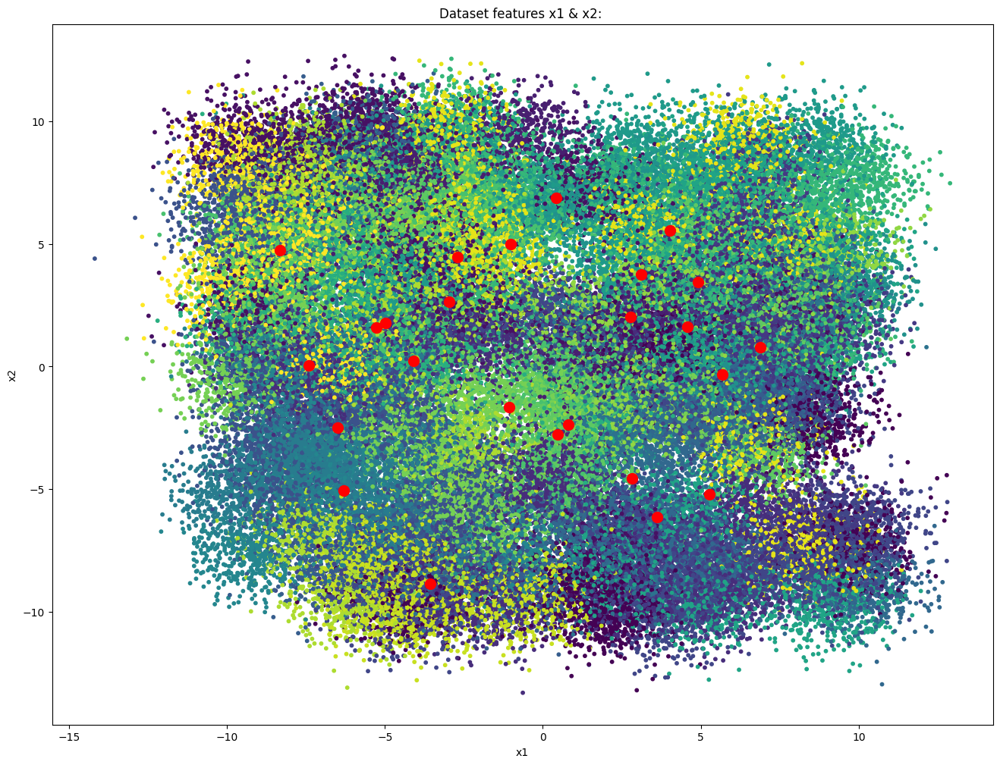

In [65]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_r21'])
plt.scatter(kmeans_r21.cluster_centers_[:, 0], kmeans_r21.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: random')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [66]:
labels = kmeans_r21.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [67]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.2199
Calinski-Harabasz Score: 5971.5872
Davies-Bouldin Score: 1.6090


### 2) random com 1000 iterações

In [68]:
kmeans_r22 = KMeans(n_clusters = 25, init = 'random', n_init = 10, max_iter=1000)
kmeans_r22.fit(df2)

KMeans(init='random', max_iter=1000, n_clusters=25, n_init=10)

In [69]:
labels = kmeans_r22.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_r22'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21,Cluster_k22
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,6,17,10,5
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,11,9,9,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,22,0,3
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,14,14,3,7
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,18,15,6,2


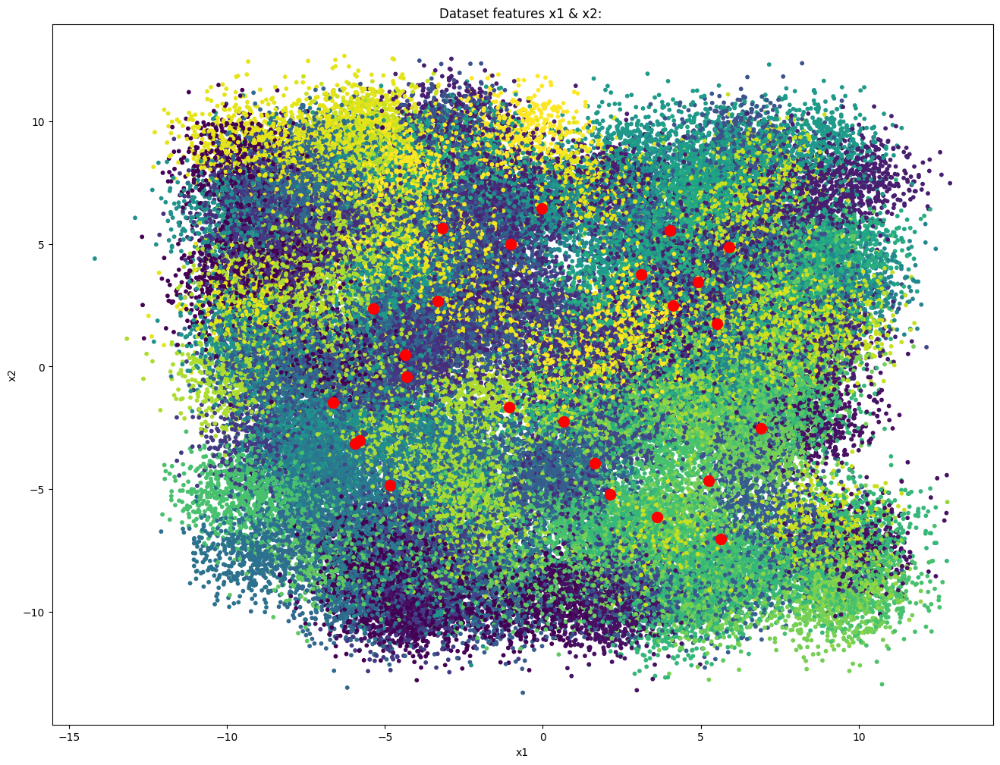

In [70]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_r22'])
plt.scatter(kmeans_r22.cluster_centers_[:, 0], kmeans_r22.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: ')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [71]:
labels = kmeans_r22.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [72]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.2429
Calinski-Harabasz Score: 6823.4286
Davies-Bouldin Score: 1.5239


### 3) k-means++ com 300 iterações

In [52]:
kmeans_k21 = KMeans(n_clusters = 11, init = 'k-means++', n_init = 10, max_iter=300)
kmeans_k21.fit(df2)

KMeans(n_clusters=11, n_init=10)

In [53]:
labels = kmeans_k21.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_k21'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,0,3,10
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,8,1,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,0,0
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,3,0,3
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,2,5,6


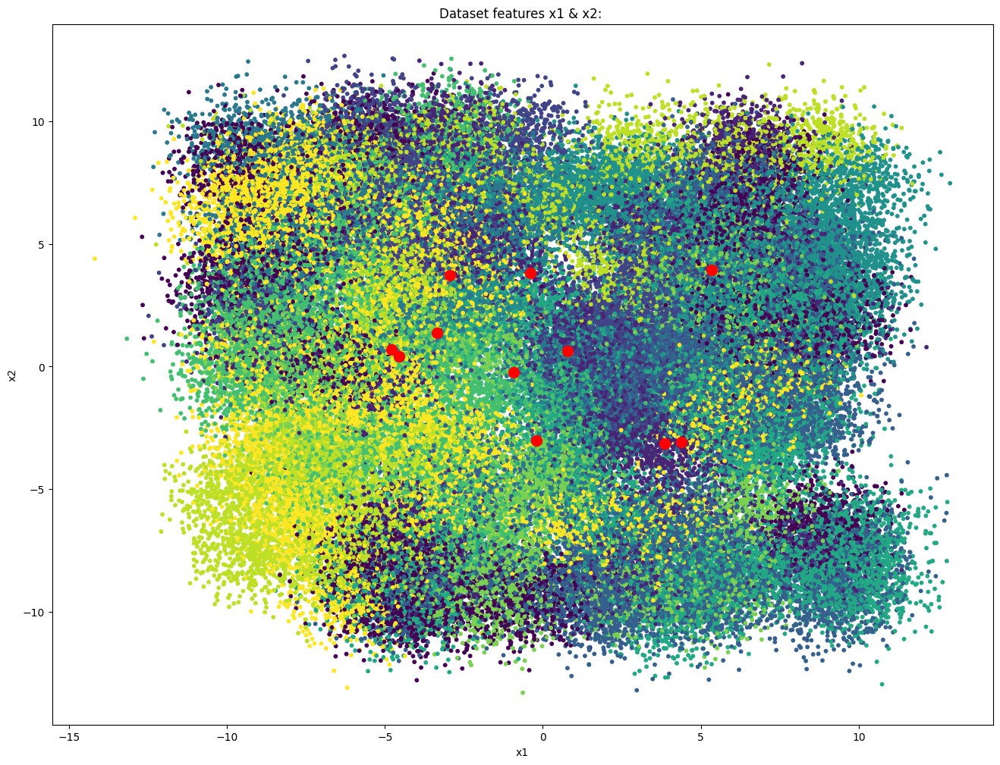

In [54]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_k21'])
plt.scatter(kmeans_k21.cluster_centers_[:, 0], kmeans_k21.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: kmeans ++')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [55]:
labels = kmeans_k21.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [56]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.1411
Calinski-Harabasz Score: 6709.5427
Davies-Bouldin Score: 2.0326


### 4) k-means++ com 1000 iterações

In [57]:
kmeans_k22 = KMeans(n_clusters = 11, init = 'k-means++', n_init = 10, max_iter=1000)
kmeans_k22.fit(df2)

KMeans(max_iter=1000, n_clusters=11, n_init=10)

In [58]:
labels = kmeans_k22.labels_

#Armazenando variável cluster no dataframe
df2['Cluster_k22'] = labels
df2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,Cluster_r21,Cluster_r22,Cluster_k21,Cluster_k22
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097,0,3,10,5
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616,8,1,9,9
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037,4,0,0,3
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647,3,0,3,7
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676,2,5,6,2


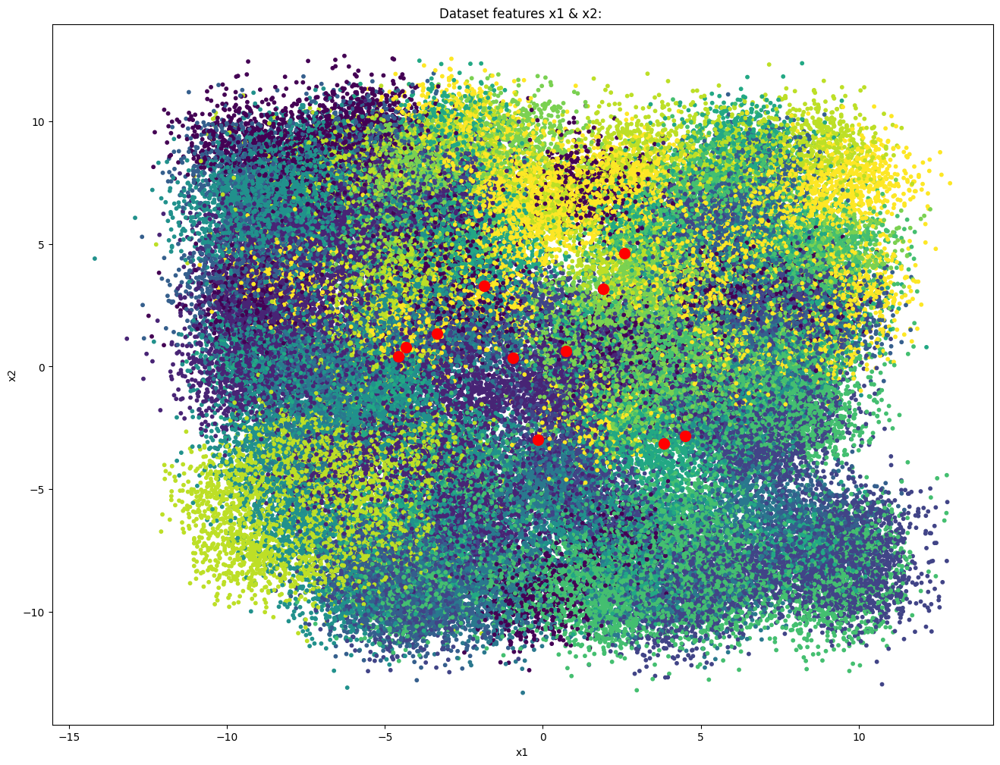

In [59]:
#Plotando Clusters com seus respectivos centróides
#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(df2['x1'], df2['x2'], s = 10, c = df2['Cluster_k22'])
plt.scatter(kmeans_k22.cluster_centers_[:, 0], kmeans_k22.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2: kmeans++')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

#### validacao da eficácia 

In [60]:
labels = kmeans_k22.labels_
silhouette = silhouette_score(df2, labels)
calinski = calinski_harabasz_score(df2, labels)
davies_bouldin = davies_bouldin_score(df2, labels)

In [61]:
print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.1555
Calinski-Harabasz Score: 7025.0857
Davies-Bouldin Score: 1.9003
